# HP vs nohp model comparison

Loads the same timestep from both a HEALPix model and a lat/lon (nohp) model,
reprojects the HP output back to a regular lat/lon grid, then compares them directly.

**Reprojection**: uses `healpix.ang2pix` (the natural inverse of the `pix2ang` + xarray
interpolation used to create the HP cache) to find the nearest HEALPix pixel for each
target lat/lon point — same package, opposite direction.

In [1]:
import sys
sys.path.insert(0, "/home/x_tagty/equivariant-posteriors")

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import healpix

from experiments.climate.notebooks.sample_predictions import get_predictions_for_timestamp
from experiments.climate.notebooks.sample_predictions_nohp import get_predictions_for_timestamp_nohp
from experiments.climate.evaluation.evaluate_climate_hp import load_create_config as load_hp_config
from experiments.climate.evaluation.evaluate_climate_nohp import load_create_config as load_nohp_config
from experiments.climate.evaluation.timestamp_utils import format_timestamp, MONTH_NAMES

/home/x_tagty/equivariant-posteriors/.venv/lib64/python3.11/site-packages/torch/cuda/__init__.py:61: FutureWarning: The pynvml package is deprecated. Please install nvidia-ml-py instead. If you did not install pynvml directly, please report this to the maintainers of the package that installed pynvml for you.
  import pynvml  # type: ignore[import]
/home/x_tagty/equivariant-posteriors/.venv/lib64/python3.11/site-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


[Compute environment] paths: 
[Paths] checkpoints: /proj/heal_pangu/eqp_climate/checkpoints (/proj/heal_pangu/eqp_climate/checkpoints)
[Paths] locks: locks (/home/x_tagty/equivariant-posteriors/experiments/climate/notebooks/locks)
[Paths] distributed_requests: distributed_requests (/home/x_tagty/equivariant-posteriors/experiments/climate/notebooks/distributed_requests)
[Paths] artifacts: /proj/heal_pangu/eqp_climate/artifacts (/proj/heal_pangu/eqp_climate/artifacts)
[Paths] datasets: /proj/heal_pangu/users/x_tagty/climateset (/proj/heal_pangu/users/x_tagty/climateset)
[Compute environment] envs: None


In [2]:
import glob, os, io, contextlib, duckdb

from lib.paths import get_checkpoint_path
from experiments.climate.data.climateset_data_hp import ClimatesetDataHP
from experiments.climate.data.climateset_data_no_hp import ClimatesetData


def _query_all_steps(checkpoint_dir, metric_name):
    db_files = sorted(glob.glob(os.path.join(str(checkpoint_dir), "duck_*.db")))
    rows = []
    for db_path in db_files:
        try:
            con = duckdb.connect(db_path, read_only=True)
            rows.extend(con.execute(
                "SELECT step, mean_float FROM checkpoint_sample_metric "
                "WHERE name = ? AND mean_float IS NOT NULL",
                [metric_name],
            ).fetchall())
            con.close()
        except Exception:
            pass
    return rows


def get_best_epoch_hp(curried, seed=0, metric_name="rmse_overall"):
    """Best epoch for an HP model — only considers epochs with an existing checkpoint file."""
    train_run = curried(ensemble_id=seed)
    checkpoint_dir = get_checkpoint_path(train_run.train_config)
    rows = _query_all_steps(checkpoint_dir, metric_name)
    if not rows:
        return None, None
    buf = io.StringIO()
    with contextlib.redirect_stdout(buf):
        train_ds = ClimatesetDataHP(train_run.train_config.train_data_config)
    n_train = len(train_ds)
    best_epoch, best_val = None, float("inf")
    for step, val in rows:
        epoch = round(step / n_train)
        if (checkpoint_dir / f"model_epoch_{epoch:04d}").is_file() and val < best_val:
            best_val, best_epoch = val, epoch
    return best_epoch, best_val


def get_best_epoch_nohp(curried, seed=0, metric_name="rmse_latw_overall"):
    """Best epoch for a nohp model — only considers epochs with an existing checkpoint file."""
    train_run = curried(ensemble_id=seed)
    checkpoint_dir = get_checkpoint_path(train_run.train_config)
    rows = _query_all_steps(checkpoint_dir, metric_name)
    if not rows:
        return None, None
    buf = io.StringIO()
    with contextlib.redirect_stdout(buf):
        train_ds = ClimatesetData(train_run.train_config.train_data_config)
    n_train = len(train_ds)
    best_epoch, best_val = None, float("inf")
    for step, val in rows:
        epoch = round(step / n_train)
        if (checkpoint_dir / f"model_epoch_{epoch:04d}").is_file() and val < best_val:
            best_val, best_epoch = val, epoch
    return best_epoch, best_val

## Config

In [3]:
# ---- HP model (HEALPix SwinTransformer) ----
HP_CONFIG  = "/home/x_tagty/equivariant-posteriors/experiments/climate/persisted_configs/final_climate_pear_runs/train_climate_pear_multiseed.py"
HP_EPOCH   = None   # None → auto-select best epoch from DuckDB; set an int to pin manually
HP_LR      = 2e-4

# ---- nohp model (CNN-LSTM / UNet / ClimaX on lat/lon grid) ----
NOHP_CONFIG = "/home/x_tagty/equivariant-posteriors/experiments/climate/persisted_configs/final_climateset_baseline_runs/train_unet_nohp_multiseed_latfix.py"
NOHP_EPOCH  = None #None  # None → auto-select best epoch from DuckDB; set an int to pin manually

# ---- Shared settings ----
CLIMATE_MODEL_IDX = 1   # 12 = NorESM2-LM  (must be the same for a fair comparison)
SEED       = 0

# ---- Timestep to compare (same in both models) ----
TARGET_YEAR  = 2060
TARGET_MONTH = 5    # 1=Jan ... 12=Dec

VAR_NAME = "pr"    # "tas" or "pr"

# ---- Field selection ----
DENORM = False  # True  → physical units (K, kg/m²/s)
                # False → normalized (zero-mean, unit-variance per training stats)

# ---- Log scale ----
LOG_SCALE = True    # True → LogNorm on error maps, SymLogNorm on field maps
                    # Useful for pr (precipitation) or normalized fields with heavy tails

# ---- Colorbar ----
SHARED_CBAR = True  # True  → one shared colorbar per row (HP and nohp on the same scale)
                    # False → individual colorbar per panel

## Load predictions for the same timestep

In [4]:
ts_label = format_timestamp("ssp245", TARGET_YEAR, TARGET_MONTH)
print(f"Loading {ts_label} from both models ...")

# ---- Build curried configs ----
hp_base   = load_hp_config(HP_CONFIG)
nohp_base = load_nohp_config(NOHP_CONFIG)

hp_curried = lambda ensemble_id, **kw: hp_base(
    ensemble_id=ensemble_id, climate_model_idx=CLIMATE_MODEL_IDX, lr=HP_LR, **kw
)
nohp_curried = lambda ensemble_id, **kw: nohp_base(
    ensemble_id=ensemble_id, climate_model_idx=CLIMATE_MODEL_IDX, **kw
)

# ---- Resolve epochs (auto or manual) ----
hp_epoch = HP_EPOCH
if hp_epoch is None:
    hp_epoch, hp_best_val = get_best_epoch_hp(hp_curried, seed=SEED)
    if hp_epoch is None:
        raise RuntimeError("No DuckDB metrics found for HP model. Set HP_EPOCH manually.")
    print(f"  HP   best epoch: {hp_epoch}  (val RMSE={hp_best_val:.4e})")

nohp_epoch = NOHP_EPOCH
if nohp_epoch is None:
    nohp_epoch, nohp_best_val = get_best_epoch_nohp(nohp_curried, seed=SEED)
    if nohp_epoch is None:
        raise RuntimeError("No DuckDB metrics found for nohp model. Set NOHP_EPOCH manually.")
    print(f"  nohp best epoch: {nohp_epoch}  (val RMSE={nohp_best_val:.4e})")

# ---- Load predictions ----
r_hp = get_predictions_for_timestamp(
    hp_curried, hp_epoch, year=TARGET_YEAR, month=TARGET_MONTH, variant_idx=SEED
)
r_nohp = get_predictions_for_timestamp_nohp(
    nohp_curried, nohp_epoch, year=TARGET_YEAR, month=TARGET_MONTH, variant_idx=SEED
)

# ---- Verify both models landed on exactly the same timestep ----
assert r_hp["timestamp_label"] == r_nohp["timestamp_label"], (
    f"Timestep mismatch! HP={r_hp['timestamp_label']} vs nohp={r_nohp['timestamp_label']}\n"
    "Check that both configs use the same scenario/year range."
)
assert r_hp["model_name"] == r_nohp["model_name"], (
    f"Climate model mismatch! HP={r_hp['model_name']} vs nohp={r_nohp['model_name']}\n"
    "Set CLIMATE_MODEL_IDX to the same value in both configs."
)

print(f"\n  HP   -> {r_hp['model_name']}  {r_hp['timestamp_label']}  "
      f"shape={r_hp['prediction'].shape}  nside={r_hp['nside']}  epoch={hp_epoch}")
print(f"  nohp -> {r_nohp['model_name']}  {r_nohp['timestamp_label']}  "
      f"shape={r_nohp['prediction'].shape}  epoch={nohp_epoch}")
print(f"\n✓ Timestep confirmed identical: {r_hp['timestamp_label']}")

Loading ssp245 · May 2060 from both models ...
climate_model=BCC-CSM2-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
  HP   best epoch: 115  (val RMSE=3.3079e-01)
climate_model=BCC-CSM2-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
  nohp best epoch: 190  (val RMSE=3.4701e-01)
No ep torch!
climate_model=BCC-CSM2-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp245_2015-2100_nohistoric_anthro-fires
  Loaded INPUT from cache: shape=(1032, 4, 12288)
Loading cached OUTPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_BCC-CSM2-MR_r1i1p1f1_nside32_tas_pr_ssp245_2015-2100_nohistoric_250_km
  Loaded OUTPUT from cache: shape=(1032, 2, 12288)
Using 1032 start indices for split='test' (seq_len=1)
  split='test': stats must be provided explicitly.
  Call set_normalization_stats() before using this dataset.


/home/x_tagty/equivariant-posteriors/lib/serialization.py:208: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_epoch = torch.load(checkpoint_path / "epoch")
/home/x_tagt

climate_model=BCC-CSM2-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_grid_BC_CH4_SO2_CO2_ssp245_2015-2100_nohistoric_anthro-fires
  Loaded INPUT from cache: shape=(1032, 4, 96, 144)
Loading cached OUTPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_BCC-CSM2-MR_r1i1p1f1_grid_tas_pr_ssp245_2015-2100_nohistoric_250_km
  Loaded OUTPUT from cache: shape=(1032, 2, 96, 144)
Using 86 start indices for split='test' (seq_len=12)
  split='test': stats must be provided explicitly.
  Call set_normalization_stats() before using this dataset.
Loaded input stats from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_grid_BC_CH4_SO2_CO2_ssp126_ssp370_ssp585_2015-2100_nohistoric_anthro-fires_sphere_stats/train_stats_seed1_valfrac0.1.npy
Loaded output stats from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_BCC-CSM2-MR_r1i1p1f1_grid_tas_pr_ssp126_ssp370_ssp585_20

In [5]:
# Select normalized or denormalized arrays for all downstream cells.
# Re-run only this cell (not the loading cells above) when toggling DENORM.
if DENORM:
    _hp_pred   = r_hp["prediction"]        # (C, P)
    _hp_true   = r_hp["target"]
    _hp_err    = r_hp["error"]
    _nohp_pred = r_nohp["prediction"]      # (C, n_lat, n_lon)
    _nohp_true = r_nohp["target"]
    _nohp_err  = r_nohp["error"]
    unit = "K" if VAR_NAME == "tas" else "kg/m²/s"
else:
    _hp_pred   = r_hp["prediction_norm"]
    _hp_true   = r_hp["target_norm"]
    _hp_err    = r_hp["error_norm"]
    _nohp_pred = r_nohp["prediction_norm"]
    _nohp_true = r_nohp["target_norm"]
    _nohp_err  = r_nohp["error_norm"]
    unit = "σ"

print(f"Using {'denormalized' if DENORM else 'normalized'} fields  (unit: {unit})")

Using normalized fields  (unit: σ)


## Reproject HP → regular lat/lon grid

Uses `healpix.ang2pix` (the inverse of `pix2ang` used when building the HP cache):
for each target (lat, lon) point, find the nearest HEALPix pixel and read its value.
The target grid is taken from the nohp dataset so both arrays share the same axes.

In [6]:
def hp_to_latlon(hp_array, nside, target_lats, target_lons):
    """
    Nearest-neighbour reprojection from a HEALPix (NESTED) array to a
    regular lat/lon grid.  Uses healpix.ang2pix — the same package used
    to build the HP cache (climateset_data_hp.py).

    hp_array    : (P,) — one HEALPix pixel value per pixel
    nside       : HEALPix nside (e.g. 32)
    target_lats : (n_lat,) latitude values in degrees
    target_lons : (n_lon,) longitude values in degrees, [0, 360)

    Returns (n_lat, n_lon) array in standard map orientation
    (latitude increases along axis 0).
    """
    lon_grid, lat_grid = np.meshgrid(target_lons, target_lats)   # (n_lat, n_lon)
    pixel_idx = healpix.ang2pix(
        nside, lon_grid.ravel(), lat_grid.ravel(), lonlat=True, nest=True
    )
    return hp_array[pixel_idx].reshape(len(target_lats), len(target_lons))


# Build target grid from nohp data
# nohp prediction shape: (C, n_lat, n_lon)
n_lat_axis = _nohp_pred.shape[0]   # 96 = n_lat (after channel indexing, shape is (n_lat, n_lon))
var_idx = r_hp["var_names"].index(VAR_NAME)
nside   = r_hp["nside"]

# Index channel first, then derive grid dimensions
_hp_pred_c   = _hp_pred[var_idx]    # (P,)
_hp_true_c   = _hp_true[var_idx]
_hp_err_c    = _hp_err[var_idx]
_nohp_pred_c = _nohp_pred[var_idx]  # (n_lat, n_lon)
_nohp_true_c = _nohp_true[var_idx]
_nohp_err_c  = _nohp_err[var_idx]

n_lat_axis = _nohp_pred_c.shape[0]   # 96
n_lon_axis = _nohp_pred_c.shape[1]   # 144
target_lats = r_nohp["lats"]                                      # (96,)
target_lons = np.linspace(0, 360, n_lon_axis, endpoint=False)     # (144,)

# HP: reproject (P,) → (n_lat, n_lon)
hp_pred_ll  = hp_to_latlon(_hp_pred_c,  nside, target_lats, target_lons)
hp_true_ll  = hp_to_latlon(_hp_true_c,  nside, target_lats, target_lons)
hp_err_ll   = hp_to_latlon(_hp_err_c,   nside, target_lats, target_lons)

# nohp: already (n_lat, n_lon)
nohp_pred   = _nohp_pred_c
nohp_true   = _nohp_true_c
nohp_err    = _nohp_err_c

print(f"HP reprojected shape : {hp_pred_ll.shape}")
print(f"nohp shape           : {nohp_pred.shape}")

HP reprojected shape : (96, 144)
nohp shape           : (96, 144)


## Side-by-side comparison

Both arrays are now on the same `(n_lat, n_lon)` grid.
Rows: True / Predicted / Abs Error.  Columns: HP model / nohp model.

HP   RMSE = 0.5268  [σ]
nohp RMSE = 0.5637  [σ]


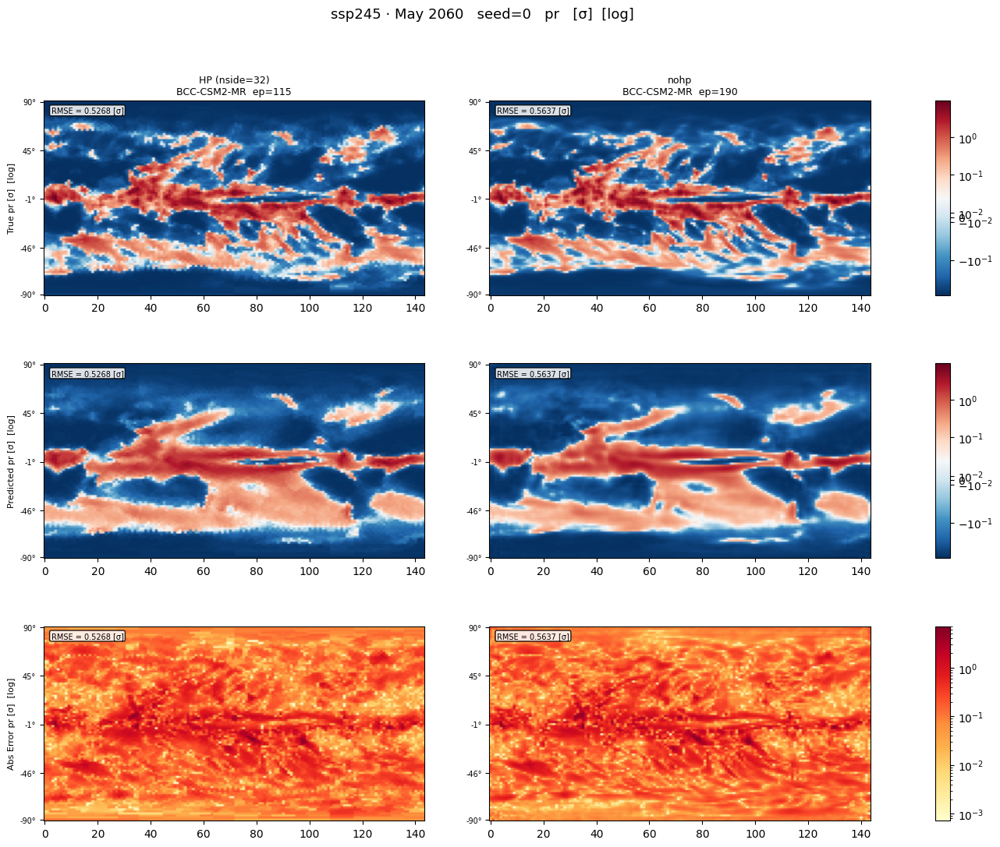

In [7]:
nside = r_hp["nside"]

vmin_field = min(hp_true_ll.min(), nohp_true.min())
vmax_field = max(hp_true_ll.max(), nohp_true.max())
vmax_err   = max(hp_err_ll.max(), nohp_err.max())


def _make_norm(vmin, vmax, log_scale):
    if not log_scale:
        return mcolors.Normalize(vmin=vmin, vmax=vmax)
    if vmin >= 0:
        safe_vmin = max(vmin, vmax * 1e-4, 1e-10)
        return mcolors.LogNorm(vmin=safe_vmin, vmax=vmax)
    linthresh = max(max(abs(vmin), abs(vmax)) * 0.01, 1e-10)
    return mcolors.SymLogNorm(linthresh=linthresh, vmin=vmin, vmax=vmax)


def add_lat_ticks(ax, lats, n_ticks=5):
    n_lat = ax.get_images()[0].get_array().shape[0]
    tick_pos = np.linspace(0, n_lat - 1, n_ticks, dtype=int)
    ax.set_yticks(tick_pos)
    ax.set_yticklabels([f"{lats[i]:.0f}°" for i in tick_pos], fontsize=7)


def _latw_rmse(pred_ll, true_ll, lats):
    """Latitude-weighted RMSE matching rmse_latw_overall metric convention.

    Averages squared error over longitudes first (per-latitude MSE), then
    takes a cos(lat)-weighted mean across latitudes before the sqrt.
    This matches the evaluation pipeline metric and avoids the sqrt(n_lon)
    inflation that results from summing over all (lat, lon) cells directly.
    """
    if lats is None:
        return float(np.sqrt(np.mean((pred_ll - true_ll) ** 2)))
    w = np.cos(np.deg2rad(lats))
    w = w / w.sum()
    mse_per_lat = np.mean((pred_ll - true_ll) ** 2, axis=1)  # (n_lat,)
    return float(np.sqrt(np.sum(w * mse_per_lat)))


def _rmse_label(ax, rmse, unit):
    """Draw RMSE in the top-left corner of ax, inside the image."""
    ax.text(0.02, 0.97, f"RMSE = {rmse:.4f} [{unit}]",
            transform=ax.transAxes, fontsize=7, va="top", ha="left",
            bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.85))


# Compute per-model RMSE on the visualised field (latitude-weighted)
_hp_rmse   = _latw_rmse(hp_pred_ll, hp_true_ll, target_lats)
_nohp_rmse = _latw_rmse(nohp_pred,  nohp_true,  target_lats)
print(f"HP   RMSE = {_hp_rmse:.4f}  [{unit}]")
print(f"nohp RMSE = {_nohp_rmse:.4f}  [{unit}]")


scale_tag = "  [log]" if LOG_SCALE else ""
rows = [
    (hp_true_ll, nohp_true, f"True {VAR_NAME} [{unit}]{scale_tag}",      "RdBu_r", vmin_field, vmax_field),
    (hp_pred_ll, nohp_pred, f"Predicted {VAR_NAME} [{unit}]{scale_tag}", "RdBu_r", vmin_field, vmax_field),
    (hp_err_ll,  nohp_err,  f"Abs Error {VAR_NAME} [{unit}]{scale_tag}", "YlOrRd", 0,          vmax_err),
]
col_labels = [
    f"HP (nside={nside})\n{r_hp['model_name']}  ep={hp_epoch}",
    f"nohp\n{r_nohp['model_name']}  ep={nohp_epoch}",
]

n_cols        = 3 if SHARED_CBAR else 2
width_ratios  = [1, 1, 0.04] if SHARED_CBAR else [1, 1]
fig = plt.figure(figsize=(15 if SHARED_CBAR else 14, 12))
gs  = fig.add_gridspec(3, n_cols, width_ratios=width_ratios, wspace=0.25, hspace=0.35)
fig.suptitle(f"{ts_label}   seed={SEED}   {VAR_NAME}   [{unit}]{scale_tag}", fontsize=13)

for row_idx, (hp_arr, nohp_arr, row_title, cmap, vmin, vmax) in enumerate(rows):
    norm    = _make_norm(vmin, vmax, LOG_SCALE)
    ax_hp   = fig.add_subplot(gs[row_idx, 0])
    ax_nohp = fig.add_subplot(gs[row_idx, 1])

    im_hp   = ax_hp.imshow(hp_arr,    origin="lower", cmap=cmap, norm=norm, aspect="auto")
    im_nohp = ax_nohp.imshow(nohp_arr, origin="lower", cmap=cmap, norm=norm, aspect="auto")

    if row_idx == 0:
        ax_hp.set_title(col_labels[0], fontsize=9)
        ax_nohp.set_title(col_labels[1], fontsize=9)
    ax_hp.set_ylabel(row_title, fontsize=8)

    # RMSE label inside image (all rows, both columns)
    _rmse_label(ax_hp,   _hp_rmse,   unit)
    _rmse_label(ax_nohp, _nohp_rmse, unit)

    for ax in (ax_hp, ax_nohp):
        if target_lats is not None:
            add_lat_ticks(ax, target_lats)

    if SHARED_CBAR:
        cax = fig.add_subplot(gs[row_idx, 2])
        fig.colorbar(im_nohp, cax=cax)
    else:
        fig.colorbar(im_hp,   ax=ax_hp,   fraction=0.03, pad=0.02)
        fig.colorbar(im_nohp, ax=ax_nohp, fraction=0.03, pad=0.02)

plt.show()

## Model difference maps

HP reprojected minus nohp — positive = HP predicts higher, negative = nohp predicts higher.

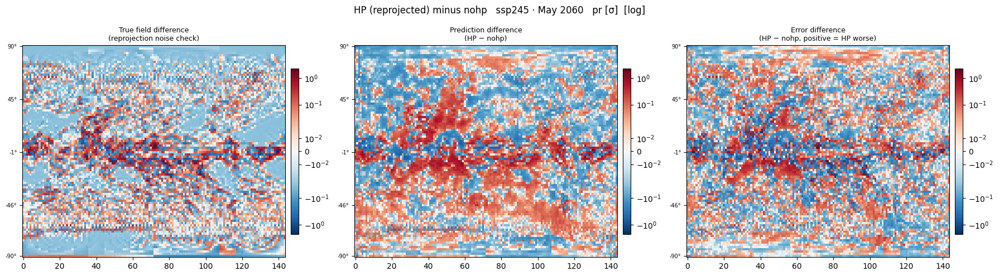

In [8]:
diff_pred = hp_pred_ll - nohp_pred   # predicted difference
diff_true = hp_true_ll - nohp_true   # true-field difference (should be ~0; shows reprojection noise)
diff_err  = hp_err_ll  - nohp_err    # positive = HP has larger error at that location

abs_max = max(abs(diff_pred).max(), abs(diff_true).max(), abs(diff_err).max())

# Difference maps always span positive and negative → SymLogNorm when log scale is on
if LOG_SCALE:
    linthresh = max(abs_max * 0.01, 1e-10)
    diff_norm = mcolors.SymLogNorm(linthresh=linthresh, vmin=-abs_max, vmax=abs_max)
else:
    diff_norm = mcolors.Normalize(vmin=-abs_max, vmax=abs_max)

scale_tag = "  [log]" if LOG_SCALE else ""
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle(
    f"HP (reprojected) minus nohp   {ts_label}   {VAR_NAME} [{unit}]{scale_tag}",
    fontsize=12
)

for ax, arr, title in zip(axes,
    [diff_true, diff_pred, diff_err],
    ["True field difference\n(reprojection noise check)",
     "Prediction difference\n(HP − nohp)",
     "Error difference\n(HP − nohp, positive = HP worse)"]):
    im = ax.imshow(arr, origin="lower", cmap="RdBu_r", norm=diff_norm, aspect="auto")
    ax.set_title(title, fontsize=9)
    if target_lats is not None:
        add_lat_ticks(ax, target_lats)
    plt.colorbar(im, ax=ax, fraction=0.03, pad=0.02)

plt.tight_layout()
plt.show()

## Zonal mean error profile

Average absolute error at each latitude — shows whether HP or nohp is better in the tropics vs poles.

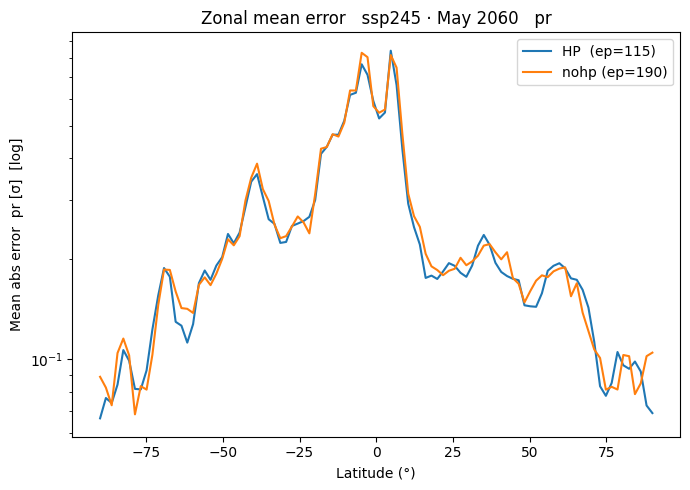

In [9]:
fig, ax = plt.subplots(figsize=(7, 5))

zonal_hp   = hp_err_ll.mean(axis=1)    # (n_lat,)
zonal_nohp = nohp_err.mean(axis=1)     # (n_lat,)

lat_axis = target_lats if target_lats is not None else np.arange(len(zonal_hp))

ax.plot(lat_axis, zonal_hp,   label=f"HP  (ep={hp_epoch})",    linewidth=1.5)
ax.plot(lat_axis, zonal_nohp, label=f"nohp (ep={nohp_epoch})", linewidth=1.5)
ax.axhline(0, color="k", linewidth=0.5)
if LOG_SCALE:
    ax.set_yscale("log")
ax.set_xlabel("Latitude (°)")
scale_tag = "  [log]" if LOG_SCALE else ""
ax.set_ylabel(f"Mean abs error  {VAR_NAME} [{unit}]{scale_tag}")
ax.set_title(f"Zonal mean error   {ts_label}   {VAR_NAME}")
ax.legend()
plt.tight_layout()
plt.show()

---

## HP vs HP ablation comparison

Compare two HP model configurations trained on the same data.
Set `HP_OVERRIDES_A` / `HP_OVERRIDES_B` to any parameters you want to differ;
everything else stays at the base-config default.

### Commonly ablated parameters (`train_climate_pear_multiseed.py`)

| Parameter | Default | Description |
|---|---|---|
| `depths` | `[4, 12, 12, 4]` | Swin blocks per stage |
| `embed_dims` | `[48, 96, 96, 48]` | Embedding dim per stage (192//4, 384//4, …) |
| `num_heads` | `[6, 12, 12, 6]` | Attention heads per stage |
| `patch_size` | `16` | Initial HEALPix patch size |
| `window_size` | `[1, 64]` | (ring, pixel) attention window |
| `lr` | `2e-4` | AdamW peak learning rate |
| `drop_rate` | `0.0` | Dropout probability |
| `climate_model_idx` | `0` | Index into `CLIMATE_MODELS` list |

In [10]:
# ---- Config files — can be the same file or two different ones ----
HP_CONFIG_A = "/home/x_tagty/equivariant-posteriors/experiments/climate/persisted_configs/final_climate_pear_runs/train_climate_pear_multiseed.py"
#HP_CONFIG_B = "/home/x_tagty/equivariant-posteriors/experiments/climate/persisted_configs/final_climate_pear_runs/train_climate_pear_multiseed.py"
# To compare against the patch_size=4 variant, uncomment:
HP_CONFIG_B = "/home/x_tagty/equivariant-posteriors/experiments/climate/persisted_configs/other_ablations/train_climate_pear_4patchsize.py"

# ---- Config A (baseline) ----
HP_OVERRIDES_A = dict(
    depths=[4, 12, 12, 4],
    embed_dims=[192 // 4, 384 // 4, 384 // 4, 192 // 4],
    lr=2e-4,
    drop_rate=0.0,
)
LABEL_A = "Baseline  depths=[4,12,12,4]"
EPOCH_A = None   # None → auto-select best epoch from DuckDB

#---- Config B (ablation) ----
HP_OVERRIDES_B = dict(
    #depths=[2, 6, 6, 2],
    depths=[4, 12, 12, 4],
    embed_dims=[192 // 4, 384 // 4, 384 // 4, 192 // 4],
    lr=2e-4,
    drop_rate=0.0,
)
LABEL_B = "Patch size 4  depths=[4,12,12,4]"
EPOCH_B = None   # None → auto-select best epoch from DuckDB

# ---- Shared settings (inherits from HP-vs-nohp section above) ----
CLIMATE_MODEL_IDX_AB = 0 #CLIMATE_MODEL_IDX
SEED_AB              = 0 #SEED

# ---- Timestep ----
TARGET_YEAR_AB  = TARGET_YEAR
TARGET_MONTH_AB = TARGET_MONTH

# ---- Variable and display ----
VAR_NAME_AB    = VAR_NAME
DENORM_AB      = DENORM
LOG_SCALE_AB   = False
SHARED_CBAR_AB = SHARED_CBAR

In [11]:
# Load base configs — each side can use a different config file
_hp_base_a = load_hp_config(HP_CONFIG_A)
_hp_base_b = load_hp_config(HP_CONFIG_B)

def _make_ab_curried(base_fn, overrides, climate_model_idx):
    def _inner(ensemble_id, **kw):
        return base_fn(
            ensemble_id=ensemble_id,
            climate_model_idx=climate_model_idx,
            **{**overrides, **kw},
        )
    return _inner

curried_a = _make_ab_curried(_hp_base_a, HP_OVERRIDES_A, CLIMATE_MODEL_IDX_AB)
curried_b = _make_ab_curried(_hp_base_b, HP_OVERRIDES_B, CLIMATE_MODEL_IDX_AB)

# Resolve epochs
_ea = EPOCH_A
if _ea is None:
    _ea, _va = get_best_epoch_hp(curried_a, seed=SEED_AB)
    if _ea is None:
        raise RuntimeError("No DuckDB metrics for Config A — set EPOCH_A manually.")
    print(f"  Config A best epoch: {_ea}  (val RMSE={_va:.4e})")

_eb = EPOCH_B
if _eb is None:
    _eb, _vb = get_best_epoch_hp(curried_b, seed=SEED_AB)
    if _eb is None:
        raise RuntimeError("No DuckDB metrics for Config B — set EPOCH_B manually.")
    print(f"  Config B best epoch: {_eb}  (val RMSE={_vb:.4e})")

epoch_a_ab, epoch_b_ab = _ea, _eb

r_a_ab = get_predictions_for_timestamp(
    curried_a, epoch_a_ab, year=TARGET_YEAR_AB, month=TARGET_MONTH_AB, variant_idx=SEED_AB
)
r_b_ab = get_predictions_for_timestamp(
    curried_b, epoch_b_ab, year=TARGET_YEAR_AB, month=TARGET_MONTH_AB, variant_idx=SEED_AB
)

ts_label_ab = r_a_ab["timestamp_label"]
assert r_a_ab["timestamp_label"] == r_b_ab["timestamp_label"], (
    f"Timestep mismatch!  A={r_a_ab['timestamp_label']}  B={r_b_ab['timestamp_label']}"
)
print(f"\n  A: {r_a_ab['model_name']}  {ts_label_ab}  shape={r_a_ab['prediction'].shape}  ep={epoch_a_ab}")
print(f"  B: {r_b_ab['model_name']}  {ts_label_ab}  shape={r_b_ab['prediction'].shape}  ep={epoch_b_ab}")
print(f"✓ Timestep confirmed identical: {ts_label_ab}")

climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
  Config A best epoch: 115  (val RMSE=2.8269e-01)
climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
  Config B best epoch: 140  (val RMSE=3.1483e-01)
climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp245_2015-2100_nohistoric_anthro-fires
  Loaded INPUT from cache: shape=(1032, 4, 12288)
Loading cached OUTPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_AWI-CM-1-1-MR_r1i1p1f1_nside32_tas_pr_ssp245_2015-2100_nohistoric_250_km
  Loaded OUTPUT from cache: shape=(1032, 2, 12288)
Using 1032 start indices for split='test' (seq_len=1)
  split='test': stats must be provided explicitly.
  Call set_normalization_stats() before using this dataset.
Loaded input stats from /proj/heal_pangu/use

/home/x_tagty/equivariant-posteriors/lib/serialization.py:208: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_epoch = torch.load(checkpoint_path / "epoch")
/home/x_tagt

climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp245_2015-2100_nohistoric_anthro-fires
  Loaded INPUT from cache: shape=(1032, 4, 12288)
Loading cached OUTPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_AWI-CM-1-1-MR_r1i1p1f1_nside32_tas_pr_ssp245_2015-2100_nohistoric_250_km
  Loaded OUTPUT from cache: shape=(1032, 2, 12288)
Using 1032 start indices for split='test' (seq_len=1)
  split='test': stats must be provided explicitly.
  Call set_normalization_stats() before using this dataset.
Loaded input stats from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp126_ssp370_ssp585_2015-2100_nohistoric_anthro-fires/train_stats_seed1_valfrac0.1.npy
Loaded output stats from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_AWI-CM-1-1-MR_r1i1p1f1_nside32_tas_pr_ssp126_ssp370_ssp585_

In [12]:
if DENORM_AB:
    _ab_pred_a = r_a_ab["prediction"]
    _ab_true_a = r_a_ab["target"]
    _ab_err_a  = r_a_ab["error"]
    _ab_pred_b = r_b_ab["prediction"]
    _ab_true_b = r_b_ab["target"]
    _ab_err_b  = r_b_ab["error"]
    unit_ab = "K" if VAR_NAME_AB == "tas" else "kg/m²/s"
else:
    _ab_pred_a = r_a_ab["prediction_norm"]
    _ab_true_a = r_a_ab["target_norm"]
    _ab_err_a  = r_a_ab["error_norm"]
    _ab_pred_b = r_b_ab["prediction_norm"]
    _ab_true_b = r_b_ab["target_norm"]
    _ab_err_b  = r_b_ab["error_norm"]
    unit_ab = "σ"

print(f"Using {'denormalized' if DENORM_AB else 'normalized'} fields  (unit: {unit_ab})")

Using normalized fields  (unit: σ)


Config A RMSE = 0.4230  [σ]
Config B RMSE = 0.4214  [σ]


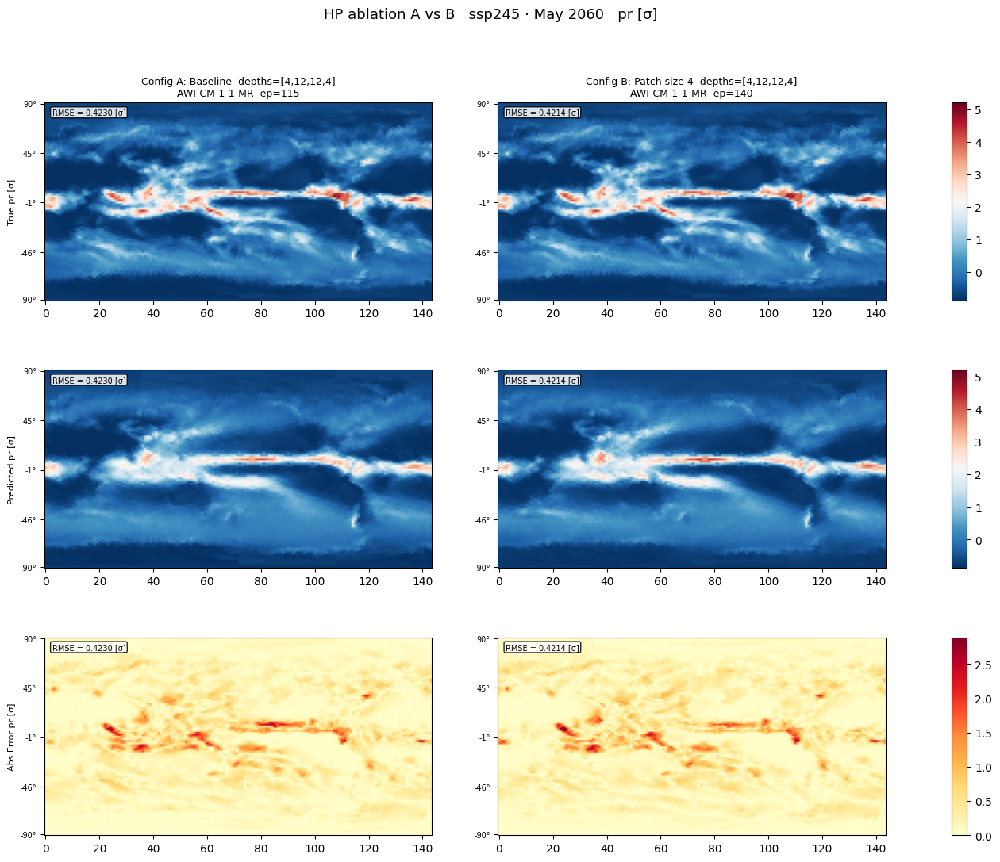

In [13]:
# Reproject both HP configs to the same lat/lon grid
try:
    _ab_lats = target_lats
    _ab_lons = target_lons
except NameError:
    _ab_lons = np.linspace(0, 360, 144, endpoint=False)
    _ab_lats = np.linspace(-90, 90, 96, endpoint=False) + (180 / 96 / 2)

var_idx_ab = r_a_ab["var_names"].index(VAR_NAME_AB)
nside_ab   = r_a_ab["nside"]

a_pred_ll_ab = hp_to_latlon(_ab_pred_a[var_idx_ab], nside_ab, _ab_lats, _ab_lons)
a_true_ll_ab = hp_to_latlon(_ab_true_a[var_idx_ab], nside_ab, _ab_lats, _ab_lons)
a_err_ll_ab  = hp_to_latlon(_ab_err_a[var_idx_ab],  nside_ab, _ab_lats, _ab_lons)
b_pred_ll_ab = hp_to_latlon(_ab_pred_b[var_idx_ab], nside_ab, _ab_lats, _ab_lons)
b_true_ll_ab = hp_to_latlon(_ab_true_b[var_idx_ab], nside_ab, _ab_lats, _ab_lons)
b_err_ll_ab  = hp_to_latlon(_ab_err_b[var_idx_ab],  nside_ab, _ab_lats, _ab_lons)

# Latitude-weighted RMSE for each config
_a_rmse_ab = _latw_rmse(a_pred_ll_ab, a_true_ll_ab, _ab_lats)
_b_rmse_ab = _latw_rmse(b_pred_ll_ab, b_true_ll_ab, _ab_lats)
print(f"Config A RMSE = {_a_rmse_ab:.4f}  [{unit_ab}]")
print(f"Config B RMSE = {_b_rmse_ab:.4f}  [{unit_ab}]")

# Side-by-side plot
_vmin_ab     = min(a_true_ll_ab.min(), b_true_ll_ab.min())
_vmax_ab     = max(a_true_ll_ab.max(), b_true_ll_ab.max())
_vmax_err_ab = max(a_err_ll_ab.max(), b_err_ll_ab.max())
_stag_ab     = "  [log]" if LOG_SCALE_AB else ""

_rows_ab = [
    (a_true_ll_ab, b_true_ll_ab, f"True {VAR_NAME_AB} [{unit_ab}]{_stag_ab}",      "RdBu_r", _vmin_ab,     _vmax_ab),
    (a_pred_ll_ab, b_pred_ll_ab, f"Predicted {VAR_NAME_AB} [{unit_ab}]{_stag_ab}", "RdBu_r", _vmin_ab,     _vmax_ab),
    (a_err_ll_ab,  b_err_ll_ab,  f"Abs Error {VAR_NAME_AB} [{unit_ab}]{_stag_ab}", "YlOrRd", 0, _vmax_err_ab),
]
_col_labels_ab = [
    f"Config A: {LABEL_A}\n{r_a_ab['model_name']}  ep={epoch_a_ab}",
    f"Config B: {LABEL_B}\n{r_b_ab['model_name']}  ep={epoch_b_ab}",
]

_nc_ab = 3 if SHARED_CBAR_AB else 2
_wr_ab = [1, 1, 0.04] if SHARED_CBAR_AB else [1, 1]
fig_ab = plt.figure(figsize=(15 if SHARED_CBAR_AB else 14, 12))
gs_ab  = fig_ab.add_gridspec(3, _nc_ab, width_ratios=_wr_ab, wspace=0.25, hspace=0.35)
fig_ab.suptitle(
    f"HP ablation A vs B   {ts_label_ab}   {VAR_NAME_AB} [{unit_ab}]{_stag_ab}",
    fontsize=13,
)

for _ri, (_a_arr, _b_arr, _row_title, _cmap, _vmin, _vmax) in enumerate(_rows_ab):
    _norm_ab = _make_norm(_vmin, _vmax, LOG_SCALE_AB)
    _ax_a    = fig_ab.add_subplot(gs_ab[_ri, 0])
    _ax_b    = fig_ab.add_subplot(gs_ab[_ri, 1])

    _im_a = _ax_a.imshow(_a_arr, origin="lower", cmap=_cmap, norm=_norm_ab, aspect="auto")
    _im_b = _ax_b.imshow(_b_arr, origin="lower", cmap=_cmap, norm=_norm_ab, aspect="auto")

    if _ri == 0:
        _ax_a.set_title(_col_labels_ab[0], fontsize=9)
        _ax_b.set_title(_col_labels_ab[1], fontsize=9)
    _ax_a.set_ylabel(_row_title, fontsize=8)

    # RMSE label inside image (all rows, both columns)
    _rmse_label(_ax_a, _a_rmse_ab, unit_ab)
    _rmse_label(_ax_b, _b_rmse_ab, unit_ab)

    for _ax in (_ax_a, _ax_b):
        add_lat_ticks(_ax, _ab_lats)

    if SHARED_CBAR_AB:
        _cax_ab = fig_ab.add_subplot(gs_ab[_ri, 2])
        fig_ab.colorbar(_im_b, cax=_cax_ab)
    else:
        fig_ab.colorbar(_im_a, ax=_ax_a, fraction=0.03, pad=0.02)
        fig_ab.colorbar(_im_b, ax=_ax_b, fraction=0.03, pad=0.02)

plt.show()

### 10-timestep multi-panel comparison

10 rows (one per timestep) × 3 columns (True | Config A | Config B), shared colour scale.
Edit `AB_TIMESTEPS` in the config cell to change which timesteps are shown.

In [14]:
# ---- 10-timestep comparison config ----
# Reuses curried_a, curried_b, epoch_a_ab, epoch_b_ab, SEED_AB from the loading cell above.
AB_TIMESTEPS = [
    (2020, 1), (2025, 7), (2030, 1), (2035, 7), (2040, 1),
    (2045, 7), (2050, 1), (2060, 7), (2070, 1), (2080, 7),
]
VAR_NAME_TS  = VAR_NAME_AB   # inherit variable from ablation config
DENORM_TS    = DENORM_AB
LOG_SCALE_TS = LOG_SCALE_AB

Loading 10 timesteps ...
climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp245_2015-2100_nohistoric_anthro-fires
  Loaded INPUT from cache: shape=(1032, 4, 12288)
Loading cached OUTPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_AWI-CM-1-1-MR_r1i1p1f1_nside32_tas_pr_ssp245_2015-2100_nohistoric_250_km
  Loaded OUTPUT from cache: shape=(1032, 2, 12288)
Using 1032 start indices for split='test' (seq_len=1)
  split='test': stats must be provided explicitly.
  Call set_normalization_stats() before using this dataset.
Loaded input stats from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp126_ssp370_ssp585_2015-2100_nohistoric_anthro-fires/train_stats_seed1_valfrac0.1.npy
Loaded output stats from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_AWI-CM-1-1-MR_r1i1p1f1_nside32_tas

/home/x_tagty/equivariant-posteriors/lib/serialization.py:208: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_epoch = torch.load(checkpoint_path / "epoch")
/home/x_tagt

climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp245_2015-2100_nohistoric_anthro-fires
  Loaded INPUT from cache: shape=(1032, 4, 12288)
Loading cached OUTPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_AWI-CM-1-1-MR_r1i1p1f1_nside32_tas_pr_ssp245_2015-2100_nohistoric_250_km
  Loaded OUTPUT from cache: shape=(1032, 2, 12288)
Using 1032 start indices for split='test' (seq_len=1)
  split='test': stats must be provided explicitly.
  Call set_normalization_stats() before using this dataset.
Loaded input stats from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp126_ssp370_ssp585_2015-2100_nohistoric_anthro-fires/train_stats_seed1_valfrac0.1.npy
Loaded output stats from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_AWI-CM-1-1-MR_r1i1p1f1_nside32_tas_pr_ssp126_ssp370_ssp585_

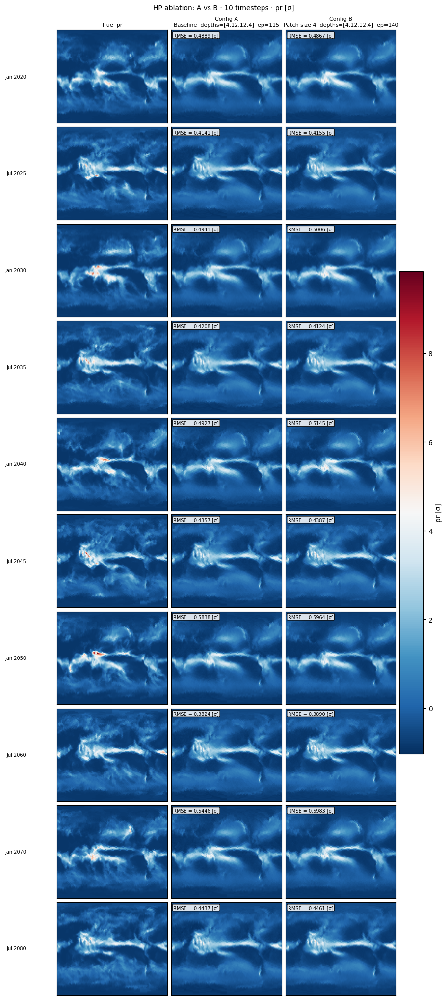

In [15]:
print(f"Loading {len(AB_TIMESTEPS)} timesteps ...")
_ts_data = []
for _yr, _mo in AB_TIMESTEPS:
    _ra_ts = get_predictions_for_timestamp(
        curried_a, epoch_a_ab, year=_yr, month=_mo, variant_idx=SEED_AB
    )
    _rb_ts = get_predictions_for_timestamp(
        curried_b, epoch_b_ab, year=_yr, month=_mo, variant_idx=SEED_AB
    )
    _ts_data.append((_ra_ts, _rb_ts))
    print(f"  {_ra_ts['timestamp_label']}")

_var_idx_ts = _ts_data[0][0]["var_names"].index(VAR_NAME_TS)
_nside_ts   = _ts_data[0][0]["nside"]

# Use target grid from reprojection cells above if available, else fallback
try:
    _ts_lats, _ts_lons = _ab_lats, _ab_lons
except NameError:
    try:
        _ts_lats, _ts_lons = target_lats, target_lons
    except NameError:
        _ts_lons = np.linspace(0, 360, 144, endpoint=False)
        _ts_lats = np.linspace(-90, 90, 96, endpoint=False) + (180 / 96 / 2)

def _ts_reproject(r, field):
    _key = field if DENORM_TS else f"{field}_norm"
    return hp_to_latlon(r[_key][_var_idx_ts], _nside_ts, _ts_lats, _ts_lons)

_pred_a_ts = [_ts_reproject(ra, "prediction") for ra, _  in _ts_data]
_pred_b_ts = [_ts_reproject(rb, "prediction") for _,  rb in _ts_data]
_true_ts   = [_ts_reproject(ra, "target")     for ra, _  in _ts_data]

# Per-timestep latitude-weighted RMSE (mean of per-lat MSE, weighted by cos(lat))
_rmse_a_ts = [_latw_rmse(_pred_a_ts[i], _true_ts[i], _ts_lats) for i in range(len(_pred_a_ts))]
_rmse_b_ts = [_latw_rmse(_pred_b_ts[i], _true_ts[i], _ts_lats) for i in range(len(_pred_b_ts))]

_unit_ts = ("K" if VAR_NAME_TS == "tas" else "kg/m²/s") if DENORM_TS else "σ"
_stag_ts = "  [log]" if LOG_SCALE_TS else ""

# Shared colour limits across all timesteps (include truth in limits)
_all_ts_maps = np.stack(_pred_a_ts + _pred_b_ts + _true_ts)
_vmin_ts     = float(_all_ts_maps.min())
_vmax_ts     = float(_all_ts_maps.max())
_norm_ts     = _make_norm(_vmin_ts, _vmax_ts, LOG_SCALE_TS)

# Layout: N rows (one per timestep) × 3 cols (True | Config A | Config B)
_n_ts     = len(AB_TIMESTEPS)
_col_data = [_true_ts, _pred_a_ts, _pred_b_ts]
_col_hdrs = [
    f"True  {VAR_NAME_TS}",
    f"Config A\n{LABEL_A}  ep={epoch_a_ab}",
    f"Config B\n{LABEL_B}  ep={epoch_b_ab}",
]

fig_ts, axes_ts = plt.subplots(
    _n_ts, 3,
    figsize=(9, 2.0 * _n_ts),
    constrained_layout=True,
)
if _n_ts == 1:
    axes_ts = axes_ts[np.newaxis, :]

fig_ts.suptitle(
    f"HP ablation: A vs B · {_n_ts} timesteps · {VAR_NAME_TS} [{_unit_ts}]{_stag_ts}",
    fontsize=10, y=1.01,
)

# Column headers on top row
for _ci, _hdr in enumerate(_col_hdrs):
    axes_ts[0, _ci].set_title(_hdr, fontsize=8)

_im_ts = None
for _ri, ((_yr_ts, _mo_ts), _row_maps) in enumerate(
    zip(AB_TIMESTEPS, zip(*_col_data))
):
    for _ci, _arr in enumerate(_row_maps):
        _ax = axes_ts[_ri, _ci]
        _im_ts = _ax.imshow(_arr, origin="lower", cmap="RdBu_r",
                             norm=_norm_ts, aspect="auto")
        _ax.set_xticks([])
        _ax.set_yticks([])
        # RMSE label on prediction columns (skip True column)
        if _ci == 1:
            _rmse_label(_ax, _rmse_a_ts[_ri], _unit_ts)
        elif _ci == 2:
            _rmse_label(_ax, _rmse_b_ts[_ri], _unit_ts)
    # Timestamp label on the left of each row
    axes_ts[_ri, 0].set_ylabel(
        f"{MONTH_NAMES[_mo_ts - 1]} {_yr_ts}", fontsize=7,
        rotation=0, ha="right", va="center", labelpad=45,
    )

fig_ts.colorbar(_im_ts, ax=axes_ts, shrink=0.5, pad=0.01,
                label=f"{VAR_NAME_TS} [{_unit_ts}]")
plt.show()

---

## Multi-model comparison: True | HP | UNet | ClimaX

10 rows (timesteps) × 4 columns.  
The **True** column uses the native lat/lon CMIP6 data (from the UNet loader — no HEALPix round-trip).  
The HP prediction is reprojected to the same 96×144 grid via `hp_to_latlon`.

> **Normalised mode caveat**: HP and nohp models compute their normalization stats
> independently (different spatial representations), so normalized values are not
> on the same scale. Use `MM_DENORM = True` for a fair visual comparison.

In [16]:
# ---- Multi-model comparison config ----
MM_HP_CONFIG     = HP_CONFIG    # HP SwinTransformer (from top config cell)
MM_HP_LR         = HP_LR
MM_UNET_CONFIG   = NOHP_CONFIG  # UNet (from top config cell)
MM_CLIMAX_CONFIG = "/home/x_tagty/equivariant-posteriors/experiments/climate/persisted_configs/final_climateset_baseline_runs/train_climax_nohp_multiseed_latfix.py"

MM_CLIMATE_MODEL_IDX = CLIMATE_MODEL_IDX   # index into CLIMATE_MODELS
MM_SEED              = SEED

MM_TIMESTEPS = [
    (2020, 1), (2025, 7), (2030, 1), (2035, 7), (2040, 1),
    (2045, 7), (2050, 1), (2060, 7), (2070, 1), (2080, 7),
]
MM_VAR_NAME  = VAR_NAME
MM_DENORM    = DENORM
MM_LOG_SCALE = LOG_SCALE

In [17]:
# Build curried configs for all three models
_mm_hp_base_fn     = load_hp_config(MM_HP_CONFIG)
_mm_unet_base_fn   = load_nohp_config(MM_UNET_CONFIG)
_mm_climax_base_fn = load_nohp_config(MM_CLIMAX_CONFIG)

_mm_hp_curried = lambda ensemble_id, **kw: _mm_hp_base_fn(
    ensemble_id=ensemble_id, climate_model_idx=MM_CLIMATE_MODEL_IDX, lr=MM_HP_LR, **kw
)
_mm_unet_curried = lambda ensemble_id, **kw: _mm_unet_base_fn(
    ensemble_id=ensemble_id, climate_model_idx=MM_CLIMATE_MODEL_IDX, **kw
)
_mm_climax_curried = lambda ensemble_id, **kw: _mm_climax_base_fn(
    ensemble_id=ensemble_id, climate_model_idx=MM_CLIMATE_MODEL_IDX, **kw
)

# Auto-select best epochs
_mm_ep_hp, _v = get_best_epoch_hp(_mm_hp_curried, seed=MM_SEED)
if _mm_ep_hp is None:
    raise RuntimeError("No DuckDB metrics for HP — set MM_HP_EPOCH manually.")
print(f"  HP     best epoch: {_mm_ep_hp}  (RMSE={_v:.4e})")

_mm_ep_unet, _v = get_best_epoch_nohp(_mm_unet_curried, seed=MM_SEED)
if _mm_ep_unet is None:
    raise RuntimeError("No DuckDB metrics for UNet — set MM_UNET_EPOCH manually.")
print(f"  UNet   best epoch: {_mm_ep_unet}  (RMSE={_v:.4e})")

_mm_ep_climax, _v = get_best_epoch_nohp(_mm_climax_curried, seed=MM_SEED)
if _mm_ep_climax is None:
    raise RuntimeError("No DuckDB metrics for ClimaX — set MM_CLIMAX_EPOCH manually.")
print(f"  ClimaX best epoch: {_mm_ep_climax}  (RMSE={_v:.4e})")

# Load predictions for every timestep in MM_TIMESTEPS
print("\nLoading timesteps ...")
_mm_data = []
for _yr, _mo in MM_TIMESTEPS:
    _r_hp_mm = get_predictions_for_timestamp(
        _mm_hp_curried, _mm_ep_hp, year=_yr, month=_mo, variant_idx=MM_SEED
    )
    _r_u_mm = get_predictions_for_timestamp_nohp(
        _mm_unet_curried, _mm_ep_unet, year=_yr, month=_mo, variant_idx=MM_SEED
    )
    _r_c_mm = get_predictions_for_timestamp_nohp(
        _mm_climax_curried, _mm_ep_climax, year=_yr, month=_mo, variant_idx=MM_SEED
    )
    _mm_data.append((_r_hp_mm, _r_u_mm, _r_c_mm))
    print(f"  {_r_hp_mm['timestamp_label']}")

climate_model=BCC-CSM2-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
  HP     best epoch: 115  (RMSE=3.3079e-01)
climate_model=BCC-CSM2-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
  UNet   best epoch: 190  (RMSE=3.4701e-01)
climate_model=BCC-CSM2-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
  ClimaX best epoch: 120  (RMSE=3.2296e-01)

Loading timesteps ...
climate_model=BCC-CSM2-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp245_2015-2100_nohistoric_anthro-fires
  Loaded INPUT from cache: shape=(1032, 4, 12288)
Loading cached OUTPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_BCC-CSM2-MR_r1i1p1f1_nside32_tas_pr_ssp245_2015-2100_nohistoric_250_km
  Loaded OUTPUT from cache: shape=(1032, 2, 12288)
Using 1032 start indices for split='test' (seq_len=1)
  split='test': s

Note: HP and nohp use independent normalization stats; normalized values are not directly comparable across model types.


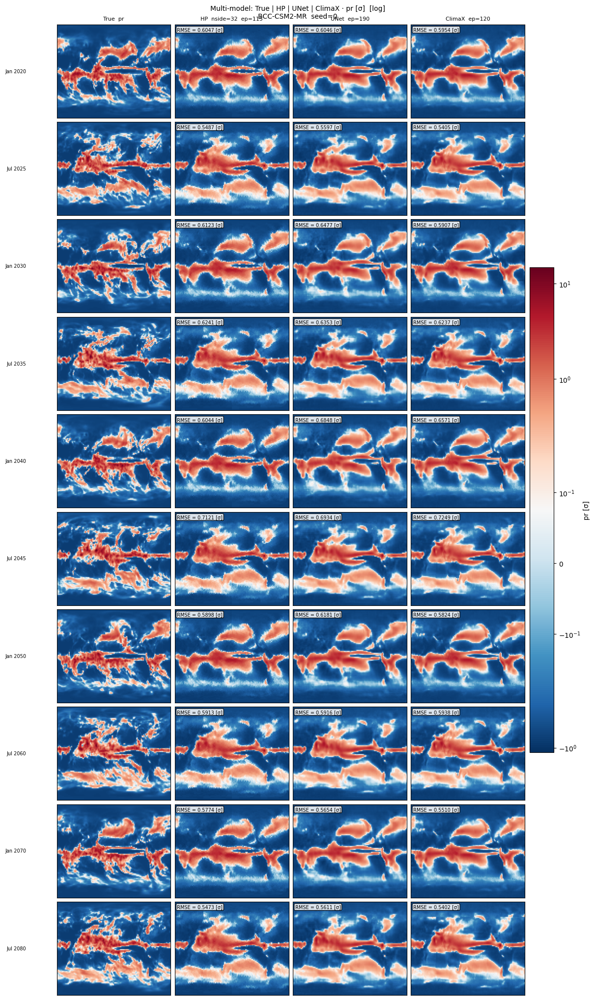

In [18]:
# Select field keys (re-run this cell + the plot cell when toggling MM_DENORM)
_mm_pred_key = "prediction" if MM_DENORM else "prediction_norm"
_mm_true_key = "target"     if MM_DENORM else "target_norm"
_mm_unit     = ("K" if MM_VAR_NAME == "tas" else "kg/m²/s") if MM_DENORM else "σ"
_mm_stag     = "  [log]" if MM_LOG_SCALE else ""

if not MM_DENORM:
    print("Note: HP and nohp use independent normalization stats; "
          "normalized values are not directly comparable across model types.")

# Extract variable index and lat/lon reference grid from the nohp data
_mm_var_idx  = _mm_data[0][0]["var_names"].index(MM_VAR_NAME)
_mm_nside_mm = _mm_data[0][0]["nside"]
_mm_ref_lats = _mm_data[0][1]["lats"]                                              # (96,)
_mm_ref_lons = np.linspace(0, 360, _mm_data[0][1]["prediction"].shape[2],          # (144,)
                            endpoint=False)

def _mm_hp_reproject(r):
    return hp_to_latlon(r[_mm_pred_key][_mm_var_idx], _mm_nside_mm,
                        _mm_ref_lats, _mm_ref_lons)

def _mm_nohp_pred(r):
    return r[_mm_pred_key][_mm_var_idx]

def _mm_nohp_true(r):
    return r[_mm_true_key][_mm_var_idx]

# Build per-timestep arrays (true from nohp — native lat/lon, no round-trip artefacts)
_mm_true_ll   = [_mm_nohp_true(r_u)     for _, r_u, _ in _mm_data]
_mm_hp_ll     = [_mm_hp_reproject(r_hp) for r_hp, _, _ in _mm_data]
_mm_unet_ll   = [_mm_nohp_pred(r_u)     for _, r_u, _ in _mm_data]
_mm_climax_ll = [_mm_nohp_pred(r_c)     for _, _, r_c in _mm_data]

# Per-timestep latitude-weighted RMSE for each model vs native truth
_mm_rmse_hp     = [_latw_rmse(_mm_hp_ll[i],     _mm_true_ll[i], _mm_ref_lats) for i in range(len(_mm_true_ll))]
_mm_rmse_unet   = [_latw_rmse(_mm_unet_ll[i],   _mm_true_ll[i], _mm_ref_lats) for i in range(len(_mm_true_ll))]
_mm_rmse_climax = [_latw_rmse(_mm_climax_ll[i], _mm_true_ll[i], _mm_ref_lats) for i in range(len(_mm_true_ll))]

# Shared colour limits across all four columns and all timesteps
_all_mm  = np.stack(_mm_true_ll + _mm_hp_ll + _mm_unet_ll + _mm_climax_ll)
_mm_vmin = float(_all_mm.min())
_mm_vmax = float(_all_mm.max())
_mm_norm_p = _make_norm(_mm_vmin, _mm_vmax, MM_LOG_SCALE)

# N rows (timesteps) × 4 cols: True | HP | UNet | ClimaX
_mm_n        = len(MM_TIMESTEPS)
_mm_col_data = [_mm_true_ll, _mm_hp_ll, _mm_unet_ll, _mm_climax_ll]
_mm_col_hdrs = [
    f"True  {MM_VAR_NAME}",
    f"HP  nside={_mm_nside_mm}  ep={_mm_ep_hp}",
    f"UNet  ep={_mm_ep_unet}",
    f"ClimaX  ep={_mm_ep_climax}",
]

fig_mm, axes_mm = plt.subplots(
    _mm_n, 4,
    figsize=(12, 2.0 * _mm_n),
    constrained_layout=True,
)
if _mm_n == 1:
    axes_mm = axes_mm[np.newaxis, :]

fig_mm.suptitle(
    f"Multi-model: True | HP | UNet | ClimaX · {MM_VAR_NAME} [{_mm_unit}]{_mm_stag}\n"
    f"{_mm_data[0][0]['model_name']}  seed={MM_SEED}",
    fontsize=10, y=1.01,
)

for _ci, _hdr in enumerate(_mm_col_hdrs):
    axes_mm[0, _ci].set_title(_hdr, fontsize=8)

_im_mm = None
for _ri, ((_yr, _mo), _row_maps) in enumerate(
    zip(MM_TIMESTEPS, zip(*_mm_col_data))
):
    for _ci, _arr in enumerate(_row_maps):
        _ax = axes_mm[_ri, _ci]
        _im_mm = _ax.imshow(_arr, origin="lower", cmap="RdBu_r",
                             norm=_mm_norm_p, aspect="auto")
        _ax.set_xticks([])
        _ax.set_yticks([])
        # RMSE label on model prediction columns (skip True column)
        if _ci == 1:
            _rmse_label(_ax, _mm_rmse_hp[_ri], _mm_unit)
        elif _ci == 2:
            _rmse_label(_ax, _mm_rmse_unet[_ri], _mm_unit)
        elif _ci == 3:
            _rmse_label(_ax, _mm_rmse_climax[_ri], _mm_unit)
    axes_mm[_ri, 0].set_ylabel(
        f"{MONTH_NAMES[_mo - 1]} {_yr}", fontsize=7,
        rotation=0, ha="right", va="center", labelpad=45,
    )

fig_mm.colorbar(_im_mm, ax=axes_mm, shrink=0.5, pad=0.01,
                label=f"{MM_VAR_NAME} [{_mm_unit}]")
plt.show()

---

## Model comparison table

Overall RMSE on the **ssp245 test set** for every climate model, averaged over seeds.
Uses `evaluate_climate` from the training-pipeline evaluation scripts at the best-validation epoch.

| Model | RMSE metric |
|---|---|
| HP | Pixel-average RMSE on HEALPix nside=32 (`rmse_overall`) |
| UNet | Lat-weighted RMSE on 96×144 lat/lon grid (`rmse_latw_overall`) |
| ClimaX | Lat-weighted RMSE on 96×144 lat/lon grid (`rmse_latw_overall`) |

> The two metric types are **not directly comparable** — use this table for within-type trends.
> This cell is slow (full inference per seed). Interrupt safely; partial `_tbl_results` can still be displayed.

### Per-sample error diagnosis

Runs full ssp245 test-set inference for HP + nohp (once each) and computes
per-sample and spatial RMSE. The `.npz` is cached on disk — re-running Cell A
only re-runs inference if the file is missing.

In [19]:
import subprocess, os
from pathlib import Path

_DIAG_CM     = "BCC-CSM2-MR"
_DIAG_SEED   = 0
_REPO_ROOT   = Path("/home/x_tagty/equivariant-posteriors")
_DIAG_OUT    = str(_REPO_ROOT / "results" / f"error_diagnosis_{_DIAG_CM}_seed{_DIAG_SEED}.npz")

if not os.path.exists(_DIAG_OUT):
    print("Running diagnose_error_patterns.py (one-time ~2x evaluation time) ...")
    subprocess.run(
        [sys.executable, "experiments/climate/evaluation/diagnose_error_patterns.py"],
        cwd=str(_REPO_ROOT),
        check=True,
    )

diag = np.load(_DIAG_OUT, allow_pickle=True)
_d_hp_rmse   = diag["hp_per_sample_rmse"]    # (M, C)
_d_nohp_rmse = diag["nohp_per_sample_rmse"]  # (M, C)
_d_years     = diag["years"]                  # (M,)
_d_months    = diag["months"]                 # (M,)
_d_var_names = list(diag["var_names"])
_d_hp_spatial   = diag["hp_spatial_rmse_ll"]   # (C, n_lat, n_lon)
_d_nohp_spatial = diag["nohp_spatial_rmse_ll"] # (C, n_lat, n_lon)
_d_lats = diag["target_lats"]
_d_lons = diag["target_lons"]

print(f"Loaded {len(_d_years)} samples, variables: {_d_var_names}")
for _i, _v in enumerate(_d_var_names):
    print(f"  {_v}: HP mean RMSE={_d_hp_rmse[:,_i].mean():.4f}  nohp mean RMSE={_d_nohp_rmse[:,_i].mean():.4f}")

Loaded 1032 samples, variables: [np.str_('tas'), np.str_('pr')]
  tas: HP mean RMSE=0.1089  nohp mean RMSE=0.1613
  pr: HP mean RMSE=0.5409  nohp mean RMSE=0.4827


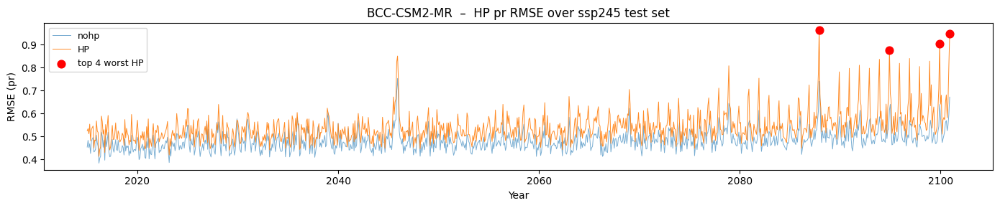


Top 15 worst HP timesteps for pr (by HP RMSE):
  Rank  Year  Mon   HP RMSE  nohp RMSE  delta
     1  2087  Dec     0.9638     0.7402    +0.2236
     2  2100  Dec     0.9459     0.6713    +0.2746
     3  2099  Dec     0.9045     0.6394    +0.2651
     4  2094  Dec     0.8762     0.6158    +0.2604
     5  2045  Dec     0.8500     0.7524    +0.0975
     6  2096  Dec     0.8394     0.5708    +0.2687
     7  2093  Dec     0.8358     0.5859    +0.2499
     8  2098  Dec     0.8279     0.5373    +0.2906
     9  2045  Nov     0.8247     0.6936    +0.1311
    10  2095  Dec     0.8185     0.5827    +0.2358
    11  2091  Dec     0.8102     0.5751    +0.2351
    12  2078  Dec     0.8076     0.6443    +0.1633
    13  2100  Nov     0.8061     0.5956    +0.2105
    14  2097  Dec     0.8046     0.5533    +0.2513
    15  2092  Dec     0.7970     0.5699    +0.2271


In [20]:
# pr only — find worst timesteps for HP
_ci_pr  = _d_var_names.index("pr")
_hp_pr   = _d_hp_rmse[:, _ci_pr]     # per-month HP RMSE
_nohp_pr = _d_nohp_rmse[:, _ci_pr]   # per-month nohp RMSE

# Top timesteps by HP RMSE (stored for Cell D below)
_N_WORST_TS  = 4
_top_ts_idx  = np.argsort(_hp_pr)[::-1][:_N_WORST_TS]
_ts_years    = _d_years[_top_ts_idx]
_ts_months   = _d_months[_top_ts_idx]

# Time series — HP pr RMSE with worst months flagged
fig, ax = plt.subplots(figsize=(14, 3))
_t = _d_years + (_d_months - 1) / 12
ax.plot(_t, _nohp_pr, lw=0.7, alpha=0.6, label="nohp", color="C0")
ax.plot(_t, _hp_pr,   lw=0.7, alpha=0.9, label="HP",   color="C1")
ax.scatter(_ts_years + (_ts_months - 1) / 12, _hp_pr[_top_ts_idx],
           c="red", s=60, zorder=5, label=f"top {_N_WORST_TS} worst HP")
ax.set_xlabel("Year"); ax.set_ylabel("RMSE (pr)")
ax.set_title(f"{_DIAG_CM}  –  HP pr RMSE over ssp245 test set")
ax.legend(fontsize=9)
plt.tight_layout(); plt.show()

# Ranked list
print(f"\nTop 15 worst HP timesteps for pr (by HP RMSE):")
print(f"  Rank  Year  Mon   HP RMSE  nohp RMSE  delta")
for _rank, _idx in enumerate(np.argsort(_hp_pr)[::-1][:15], 1):
    _mo = MONTH_NAMES[_d_months[_idx] - 1]
    print(f"  {_rank:>4}  {_d_years[_idx]:>4}  {_mo:>3}  {_hp_pr[_idx]:>9.4f}  {_nohp_pr[_idx]:>9.4f}  {_hp_pr[_idx]-_nohp_pr[_idx]:>+9.4f}")

Top HP worst locations for pr (highest time-averaged RMSE):
  1. lat=+4.7  lon=282.5  HP=1.8889  nohp=1.8122
  2. lat=+14.2  lon=97.5  HP=1.7616  nohp=1.8387
  3. lat=+18.0  lon=97.5  HP=1.7452  nohp=1.8829
  4. lat=-8.5  lon=195.0  HP=1.7268  nohp=1.8273
  5. lat=+19.9  lon=97.5  HP=1.6928  nohp=1.6929
  6. lat=+16.1  lon=97.5  HP=1.6887  nohp=1.8592
  7. lat=-8.5  lon=197.5  HP=1.6879  nohp=1.7530
  8. lat=+6.6  lon=77.5  HP=1.6760  nohp=1.8560


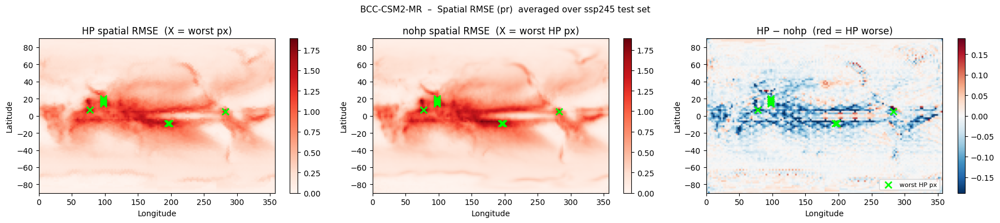

In [21]:
# Spatial RMSE map for pr; find worst HP locations (stored for Cell D below)
_ci_pr    = _d_var_names.index("pr")
_hp_smap   = _d_hp_spatial[_ci_pr]     # (n_lat, n_lon)
_nohp_smap = _d_nohp_spatial[_ci_pr]   # (n_lat, n_lon)
_diff_smap = _hp_smap - _nohp_smap     # positive = HP worse here

# Top worst HP pixel locations (by time-averaged RMSE)
_N_WORST_PX = 8
_worst_flat = np.argsort(_hp_smap.ravel())[::-1][:_N_WORST_PX]
_w_lat_idx, _w_lon_idx = np.unravel_index(_worst_flat, _hp_smap.shape)
_w_lats_px  = _d_lats[_w_lat_idx]
_w_lons_px  = _d_lons[_w_lon_idx]

print("Top HP worst locations for pr (highest time-averaged RMSE):")
for _k in range(_N_WORST_PX):
    print(f"  {_k+1}. lat={_w_lats_px[_k]:+.1f}  lon={_w_lons_px[_k]:.1f}  HP={_hp_smap[_w_lat_idx[_k], _w_lon_idx[_k]]:.4f}  nohp={_nohp_smap[_w_lat_idx[_k], _w_lon_idx[_k]]:.4f}")

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
fig.suptitle(f"{_DIAG_CM}  –  Spatial RMSE (pr)  averaged over ssp245 test set", fontsize=11)

_vmax = max(_hp_smap.max(), _nohp_smap.max())
_ext  = [_d_lons[0], _d_lons[-1], _d_lats[0], _d_lats[-1]]
_kw   = dict(origin="lower", extent=_ext, aspect="auto")

im0 = axes[0].imshow(_hp_smap,   vmin=0, vmax=_vmax, cmap="Reds",   **_kw)
axes[0].scatter(_w_lons_px, _w_lats_px, c="lime", s=70, marker="x", linewidths=2, zorder=5)
axes[0].set_title("HP spatial RMSE  (X = worst px)"); plt.colorbar(im0, ax=axes[0])

im1 = axes[1].imshow(_nohp_smap, vmin=0, vmax=_vmax, cmap="Reds",   **_kw)
axes[1].scatter(_w_lons_px, _w_lats_px, c="lime", s=70, marker="x", linewidths=2, zorder=5)
axes[1].set_title("nohp spatial RMSE  (X = worst HP px)"); plt.colorbar(im1, ax=axes[1])

_dlim = np.percentile(np.abs(_diff_smap), 99)
im2 = axes[2].imshow(_diff_smap, vmin=-_dlim, vmax=_dlim, cmap="RdBu_r", **_kw)
axes[2].scatter(_w_lons_px, _w_lats_px, c="lime", s=70, marker="x", linewidths=2,
                zorder=5, label="worst HP px")
axes[2].set_title("HP − nohp  (red = HP worse)"); plt.colorbar(im2, ax=axes[2])
axes[2].legend(fontsize=8, loc="lower right")

for ax in axes:
    ax.set_xlabel("Longitude"); ax.set_ylabel("Latitude")
plt.tight_layout(); plt.show()

Top 10 worst HP timesteps for pr:
  Dec 2087  HP RMSE=0.9638
  Dec 2100  HP RMSE=0.9459
  Dec 2099  HP RMSE=0.9045
  Dec 2094  HP RMSE=0.8762
  Dec 2045  HP RMSE=0.8500
  Dec 2096  HP RMSE=0.8394
  Dec 2093  HP RMSE=0.8358
  Dec 2098  HP RMSE=0.8279
  Nov 2045  HP RMSE=0.8247
  Dec 2095  HP RMSE=0.8185

Loading predictions ...
climate_model=BCC-CSM2-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp245_2015-2100_nohistoric_anthro-fires
  Loaded INPUT from cache: shape=(1032, 4, 12288)
Loading cached OUTPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_BCC-CSM2-MR_r1i1p1f1_nside32_tas_pr_ssp245_2015-2100_nohistoric_250_km
  Loaded OUTPUT from cache: shape=(1032, 2, 12288)
Using 1032 start indices for split='test' (seq_len=1)
  split='test': stats must be provided explicitly.
  Call set_normalization_stats() before using this dataset.
Loade

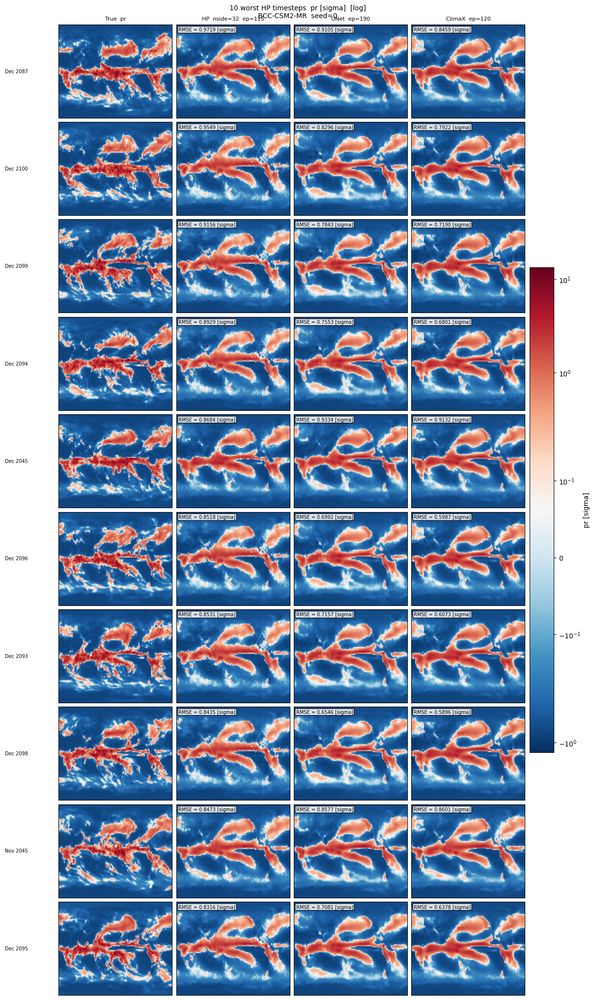

In [22]:
# 10 worst-HP timesteps for pr: True | HP | UNet | ClimaX
# Requires: cells 11 (helpers), 25-26 (mm curried configs), 30 (diagnostic npz)

_WTS_N      = 10          # number of worst timesteps to show
_WTS_VAR    = "pr"
_WTS_DENORM = MM_DENORM   # inherit from main multi-model config cell
_WTS_LOG    = MM_LOG_SCALE

# Find the 10 worst HP timesteps for pr from the diagnostic .npz
_wts_ci  = _d_var_names.index(_WTS_VAR)
_wts_hp  = _d_hp_rmse[:, _wts_ci]
_wts_top = np.argsort(_wts_hp)[::-1][:_WTS_N]
_wts_ts  = [(int(_d_years[i]), int(_d_months[i])) for i in _wts_top]

print(f"Top {_WTS_N} worst HP timesteps for {_WTS_VAR}:")
for (_yr, _mo), _idx in zip(_wts_ts, _wts_top):
    print(f"  {MONTH_NAMES[_mo-1]} {_yr}  HP RMSE={_wts_hp[_idx]:.4f}")

# Load predictions for all three models at each worst timestep
print("\nLoading predictions ...")
_wts_data = []
for _yr, _mo in _wts_ts:
    _r_hp_w = get_predictions_for_timestamp(
        _mm_hp_curried, _mm_ep_hp, year=_yr, month=_mo, variant_idx=MM_SEED)
    _r_u_w = get_predictions_for_timestamp_nohp(
        _mm_unet_curried, _mm_ep_unet, year=_yr, month=_mo, variant_idx=MM_SEED)
    _r_c_w = get_predictions_for_timestamp_nohp(
        _mm_climax_curried, _mm_ep_climax, year=_yr, month=_mo, variant_idx=MM_SEED)
    _wts_data.append((_r_hp_w, _r_u_w, _r_c_w))
    print(f"  {_r_hp_w['timestamp_label']}")

# Field key and units
_wts_pred_key = "prediction" if _WTS_DENORM else "prediction_norm"
_wts_true_key = "target"     if _WTS_DENORM else "target_norm"
_wts_unit     = "kg/m2/s"    if _WTS_DENORM else "sigma"
_wts_log_tag  = "  [log]"    if _WTS_LOG    else ""

_wts_var_idx = _wts_data[0][0]["var_names"].index(_WTS_VAR)
_wts_nside   = _wts_data[0][0]["nside"]
_wts_lats    = _wts_data[0][1]["lats"]                                                    # (n_lat,)
_wts_lons    = np.linspace(0, 360, _wts_data[0][1]["prediction"].shape[2], endpoint=False)  # (n_lon,)

# Build field arrays for each column
_wts_true_ll   = [d[1][_wts_true_key][_wts_var_idx]                                         for d in _wts_data]
_wts_hp_ll     = [hp_to_latlon(d[0][_wts_pred_key][_wts_var_idx], _wts_nside,
                               _wts_lats, _wts_lons)                                         for d in _wts_data]
_wts_unet_ll   = [d[1][_wts_pred_key][_wts_var_idx]                                         for d in _wts_data]
_wts_climax_ll = [d[2][_wts_pred_key][_wts_var_idx]                                         for d in _wts_data]

# Latitude-weighted RMSE per timestep per model
_wts_rmse_hp     = [_latw_rmse(_wts_hp_ll[i],     _wts_true_ll[i], _wts_lats) for i in range(_WTS_N)]
_wts_rmse_unet   = [_latw_rmse(_wts_unet_ll[i],   _wts_true_ll[i], _wts_lats) for i in range(_WTS_N)]
_wts_rmse_climax = [_latw_rmse(_wts_climax_ll[i], _wts_true_ll[i], _wts_lats) for i in range(_WTS_N)]

# Shared colour limits across all rows and columns
_all_wts  = np.stack(_wts_true_ll + _wts_hp_ll + _wts_unet_ll + _wts_climax_ll)
_wts_vmin = float(_all_wts.min())
_wts_vmax = float(_all_wts.max())
_wts_norm = _make_norm(_wts_vmin, _wts_vmax, _WTS_LOG)

# N rows x 4 cols: True | HP | UNet | ClimaX
_wts_col_data = [_wts_true_ll, _wts_hp_ll, _wts_unet_ll, _wts_climax_ll]
_wts_col_hdrs = [
    f"True  {_WTS_VAR}",
    f"HP  nside={_wts_nside}  ep={_mm_ep_hp}",
    f"UNet  ep={_mm_ep_unet}",
    f"ClimaX  ep={_mm_ep_climax}",
]

fig_wts, axes_wts = plt.subplots(
    _WTS_N, 4,
    figsize=(12, 2.0 * _WTS_N),
    constrained_layout=True,
)
fig_wts.suptitle(
    f"10 worst HP timesteps  {_WTS_VAR} [{_wts_unit}]{_wts_log_tag}\n"
    f"{_wts_data[0][0]['model_name']}  seed={MM_SEED}",
    fontsize=10, y=1.01,
)

for _ci, _hdr in enumerate(_wts_col_hdrs):
    axes_wts[0, _ci].set_title(_hdr, fontsize=8)

_im_wts = None
for _ri, ((_yr, _mo), _row_maps) in enumerate(zip(_wts_ts, zip(*_wts_col_data))):
    for _ci, _arr in enumerate(_row_maps):
        _ax = axes_wts[_ri, _ci]
        _im_wts = _ax.imshow(_arr, origin="lower", cmap="RdBu_r",
                              norm=_wts_norm, aspect="auto")
        _ax.set_xticks([])
        _ax.set_yticks([])
        if _ci == 1:
            _rmse_label(_ax, _wts_rmse_hp[_ri],     _wts_unit)
        elif _ci == 2:
            _rmse_label(_ax, _wts_rmse_unet[_ri],   _wts_unit)
        elif _ci == 3:
            _rmse_label(_ax, _wts_rmse_climax[_ri], _wts_unit)
    axes_wts[_ri, 0].set_ylabel(
        f"{MONTH_NAMES[_mo - 1]} {_yr}", fontsize=7,
        rotation=0, ha="right", va="center", labelpad=45,
    )

fig_wts.colorbar(_im_wts, ax=axes_wts, shrink=0.5, pad=0.01,
                 label=f"{_WTS_VAR} [{_wts_unit}]")
plt.show()


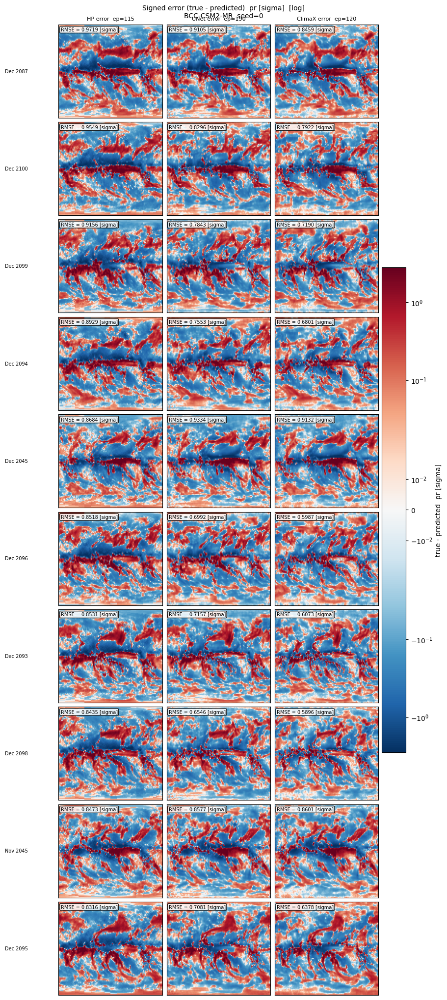

In [24]:
# Signed error (true - predicted) for the same 10 worst HP timesteps
# Requires: Cell D (provides _wts_true_ll, _wts_hp_ll, _wts_unet_ll, _wts_climax_ll,
#                            _wts_ts, _wts_lats, _wts_rmse_*, _wts_unit, _wts_log_tag)

_wts_err_hp     = [_wts_true_ll[i] - _wts_hp_ll[i]     for i in range(_WTS_N)]
_wts_err_unet   = [_wts_true_ll[i] - _wts_unet_ll[i]   for i in range(_WTS_N)]
_wts_err_climax = [_wts_true_ll[i] - _wts_climax_ll[i] for i in range(_WTS_N)]

# Symmetric colour limits: 99th percentile of absolute errors across all models/timesteps
_all_errs  = np.stack(_wts_err_hp + _wts_err_unet + _wts_err_climax)
_elim      = float(np.percentile(np.abs(_all_errs), 99))
_err_norm  = _make_norm(-_elim, _elim, _WTS_LOG)

_wts_err_col_data = [_wts_err_hp, _wts_err_unet, _wts_err_climax]
_wts_err_col_hdrs = [
    f"HP error  ep={_mm_ep_hp}",
    f"UNet error  ep={_mm_ep_unet}",
    f"ClimaX error  ep={_mm_ep_climax}",
]
_wts_rmse_cols = [_wts_rmse_hp, _wts_rmse_unet, _wts_rmse_climax]

fig_err, axes_err = plt.subplots(
    _WTS_N, 3,
    figsize=(9, 2.0 * _WTS_N),
    constrained_layout=True,
)
fig_err.suptitle(
    f"Signed error (true - predicted)  {_WTS_VAR} [{_wts_unit}]{_wts_log_tag}\n"
    f"{_wts_data[0][0]['model_name']}  seed={MM_SEED}",
    fontsize=10, y=1.01,
)

for _ci, _hdr in enumerate(_wts_err_col_hdrs):
    axes_err[0, _ci].set_title(_hdr, fontsize=8)

_im_err = None
for _ri, ((_yr, _mo), _row_errs) in enumerate(zip(_wts_ts, zip(*_wts_err_col_data))):
    for _ci, _arr in enumerate(_row_errs):
        _ax = axes_err[_ri, _ci]
        _im_err = _ax.imshow(_arr, origin="lower", cmap="RdBu_r",
                              norm=_err_norm, aspect="auto")
        _ax.set_xticks([])
        _ax.set_yticks([])
        _rmse_label(_ax, _wts_rmse_cols[_ci][_ri], _wts_unit)
    axes_err[_ri, 0].set_ylabel(
        f"{MONTH_NAMES[_mo - 1]} {_yr}", fontsize=7,
        rotation=0, ha="right", va="center", labelpad=45,
    )

fig_err.colorbar(_im_err, ax=axes_err, shrink=0.5, pad=0.01,
                 label=f"true - predicted  {_WTS_VAR} [{_wts_unit}]")
plt.show()


In [ ]:
# NOTE: This cell runs ~100+ full model evaluations across all climate models,
# seeds, and ML models — it can take many hours.
# For per-sample/spatial error diagnosis (faster), use the cells above instead.

import pandas as pd

from experiments.climate.evaluation.evaluate_climate_hp import (
    evaluate_climate as _eval_hp,
)
from experiments.climate.evaluation.evaluate_climate_nohp import (
    evaluate_climate as _eval_nohp,
)
from experiments.climate.persisted_configs.final_climate_pear_runs.train_climate_pear_multiseed import (
    CLIMATE_MODELS as _ALL_CLIMATE_MODELS,
)

# ---- Table config ----
TABLE_HP_CONFIG     = "/home/x_tagty/equivariant-posteriors/experiments/climate/persisted_configs/final_climate_pear_runs/train_climate_pear_multiseed.py"
TABLE_HP_LR         = 2e-4
TABLE_UNET_CONFIG   = "/home/x_tagty/equivariant-posteriors/experiments/climate/persisted_configs/final_climateset_baseline_runs/train_unet_nohp_multiseed_latfix.py"
TABLE_CLIMAX_CONFIG = "/home/x_tagty/equivariant-posteriors/experiments/climate/persisted_configs/final_climateset_baseline_runs/train_climax_nohp_multiseed_latfix.py"
TABLE_N_SEEDS = 3    # seeds 0 .. N-1

# ---- Build base config loaders ----
_tbl_hp_base     = load_hp_config(TABLE_HP_CONFIG)
_tbl_unet_base   = load_nohp_config(TABLE_UNET_CONFIG)
_tbl_climax_base = load_nohp_config(TABLE_CLIMAX_CONFIG)

def _build_curried(base_fn, model_idx, lr=None):
    if lr is not None:
        return lambda ensemble_id, **kw: base_fn(
            ensemble_id=ensemble_id, climate_model_idx=model_idx, lr=lr, **kw
        )
    return lambda ensemble_id, **kw: base_fn(
        ensemble_id=ensemble_id, climate_model_idx=model_idx, **kw
    )

# (display_name, curried_factory, best_epoch_fn, eval_fn)
_ml_specs = [
    ("HP",     lambda mi: _build_curried(_tbl_hp_base,     mi, lr=TABLE_HP_LR), get_best_epoch_hp,   _eval_hp),
    ("UNet",   lambda mi: _build_curried(_tbl_unet_base,   mi),                 get_best_epoch_nohp, _eval_nohp),
    ("ClimaX", lambda mi: _build_curried(_tbl_climax_base, mi),                 get_best_epoch_nohp, _eval_nohp),
]

print(f"Evaluating {len(_ALL_CLIMATE_MODELS)} climate models "
      f"× {TABLE_N_SEEDS} seeds × {len(_ml_specs)} ML models "
      f"on ssp245 test set at best-validation epoch.")
print("Results are written to DuckDB; re-running this cell recomputes all entries.\n")

_tbl_results = {}  # {cm_name: {ml_name: [rmse_seed0, ...]}}

for _mi, (_cm_name, _) in enumerate(_ALL_CLIMATE_MODELS):
    _tbl_results[_cm_name] = {}
    for _ml_name, _make_curried_fn, _get_best_fn, _eval_fn in _ml_specs:
        _curried = _make_curried_fn(_mi)
        _rmses   = []
        for _seed in range(TABLE_N_SEEDS):
            _best_ep, _ = _get_best_fn(_curried, seed=_seed)
            if _best_ep is None:
                print(f"  {_cm_name:22s} | {_ml_name:7s} | seed={_seed} → no checkpoint, skip")
                continue
            print(f"  {_cm_name:22s} | {_ml_name:7s} | seed={_seed} | ep={_best_ep:4d} → evaluating ...",
                  end="", flush=True)
            _rmse = _eval_fn(_curried, _best_ep, variant_idx=_seed)
            if _rmse is not None:
                _rmses.append(float(_rmse))
                print(f"  RMSE={_rmse:.4f}")
            else:
                print("  failed")
        _tbl_results[_cm_name][_ml_name] = _rmses
        _mean = np.mean(_rmses) if _rmses else float("nan")
        print(f"  ↳ {_cm_name:22s} | {_ml_name:7s} | mean={_mean:.4f}  ({len(_rmses)}/{TABLE_N_SEEDS} seeds)\n")

print("=== Done ===")

Evaluating 15 climate models × 3 seeds × 3 ML models on ssp245 test set at best-validation epoch.
Results are written to DuckDB; re-running this cell recomputes all entries.

climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
  AWI-CM-1-1-MR          | HP      | seed=0 | ep= 115 → evaluating ...Registering datasets and models...
[eval] Evaluating variant 0, epoch 115
climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/inputs_nside32_BC_CH4_SO2_CO2_ssp126_ssp370_ssp585_2015-2100_nohistoric_anthro-fires
  Loaded INPUT from cache: shape=(3096, 4, 12288)
Loading cached OUTPUT data from /proj/heal_pangu/users/x_tagty/climateset/cache/outputs_AWI-CM-1-1-MR_r1i1p1f1_nside32_tas_pr_ssp126_ssp370_ssp585_2015-2100_nohistoric_250_km
  Loaded OUTPUT from cache: shape=(3096, 2, 12288)
Split: train
  Total timesteps:    3096
  Sequence leng

/home/x_tagty/equivariant-posteriors/lib/serialization.py:208: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_epoch = torch.load(checkpoint_path / "epoch")
/home/x_tagt

[eval] Computing latitude-weighted RMSE...
Concatenated predictions and targets. Shapes: torch.Size([86, 12, 2, 96, 144]) torch.Size([86, 12, 2, 96, 144])
[eval] RMSE results: [np.float64(0.15826951252957314), np.float64(0.4787762543465306)]
[eval]   RMSE tas: 0.158270
[eval]   RMSE pr: 0.478776
[eval]   Overall lat-weighted RMSE: 0.318523
check float64 or not <class 'float'>
[eval]   RMSE latw denorm tas: 2.360342
check float64 or not <class 'float'>
[eval]   RMSE latw denorm pr: 0.000019
[eval] Exporting metrics to staging...
[eval] Evaluation complete for variant 0, epoch 190!
  RMSE=0.3185
climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=1
Using 16 workers [SLURM_CPUS_ON_NODE]
  AWI-CM-1-1-MR          | UNet    | seed=1 | ep= 200 → evaluating ...Registering datasets and models...
[eval] Evaluating variant 1, epoch 200
climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=1
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climate

/home/x_tagty/equivariant-posteriors/lib/serialization.py:208: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_epoch = torch.load(checkpoint_path / "epoch")
/home/x_tagt

[eval] Computing latitude-weighted RMSE...
Concatenated predictions and targets. Shapes: torch.Size([86, 12, 2, 96, 144]) torch.Size([86, 12, 2, 96, 144])
[eval] RMSE results: [np.float64(0.15908762584675773), np.float64(0.4758111276937743)]
[eval]   RMSE tas: 0.159088
[eval]   RMSE pr: 0.475811
[eval]   Overall lat-weighted RMSE: 0.317449
check float64 or not <class 'float'>
[eval]   RMSE latw denorm tas: 2.371536
check float64 or not <class 'float'>
[eval]   RMSE latw denorm pr: 0.000019
[eval] Exporting metrics to staging...
[eval] Evaluation complete for variant 1, epoch 200!
  RMSE=0.3174
climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=2
Using 16 workers [SLURM_CPUS_ON_NODE]
  AWI-CM-1-1-MR          | UNet    | seed=2 | ep= 200 → evaluating ...Registering datasets and models...
[eval] Evaluating variant 2, epoch 200
climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=2
Using 16 workers [SLURM_CPUS_ON_NODE]
Loading cached INPUT data from /proj/heal_pangu/users/x_tagty/climate

/home/x_tagty/equivariant-posteriors/lib/serialization.py:208: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_epoch = torch.load(checkpoint_path / "epoch")
/home/x_tagt

[eval] Computing latitude-weighted RMSE...
Concatenated predictions and targets. Shapes: torch.Size([86, 12, 2, 96, 144]) torch.Size([86, 12, 2, 96, 144])
[eval] RMSE results: [np.float64(0.16791275852241033), np.float64(0.4785023496398114)]
[eval]   RMSE tas: 0.167913
[eval]   RMSE pr: 0.478502
[eval]   Overall lat-weighted RMSE: 0.323208
check float64 or not <class 'float'>
[eval]   RMSE latw denorm tas: 2.503694
check float64 or not <class 'float'>
[eval]   RMSE latw denorm pr: 0.000019
[eval] Exporting metrics to staging...
[eval] Evaluation complete for variant 2, epoch 200!
  RMSE=0.3232
  ↳ AWI-CM-1-1-MR          | UNet    | mean=0.3197  (3/3 seeds)

climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
  AWI-CM-1-1-MR          | ClimaX  | seed=0 | ep=  60 → evaluating ...Registering datasets and models...
[eval] Evaluating variant 0, epoch 60
climate_model=AWI-CM-1-1-MR, ensemble=r1i1p1f1, seed=0
Using 16 workers [SLURM_CPUS_ON_NODE]
Loadi

/home/x_tagty/equivariant-posteriors/lib/serialization.py:208: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_epoch = torch.load(checkpoint_path / "epoch")
/home/x_tagt

Loaded earlier epoch 60, the latest epoch is 60.
[eval] Computing latitude-weighted RMSE...


In [ ]:
# ---- Build summary DataFrame ----
# Safe to run on partial _tbl_results if the evaluation cell was interrupted.
_ml_names = [s[0] for s in _ml_specs]

_disp_rows = []
for _cm_name, _ in _ALL_CLIMATE_MODELS:
    _row = {"Climate model": _cm_name}
    for _ml_name in _ml_names:
        _rmses = _tbl_results.get(_cm_name, {}).get(_ml_name, [])
        if _rmses:
            _m = float(np.mean(_rmses))
            _s = float(np.std(_rmses)) if len(_rmses) > 1 else 0.0
            _row[_ml_name]         = f"{_m:.4f} ± {_s:.4f}"
            _row[f"{_ml_name}__v"] = _m
        else:
            _row[_ml_name]         = "—"
            _row[f"{_ml_name}__v"] = float("nan")
    _disp_rows.append(_row)

# Aggregate row (mean across climate models with at least one seed)
_agg = {"Climate model": "── mean ──"}
for _ml_name in _ml_names:
    _vals = [r[f"{_ml_name}__v"] for r in _disp_rows if not np.isnan(r[f"{_ml_name}__v"])]
    _agg[_ml_name]         = f"{np.mean(_vals):.4f}" if _vals else "—"
    _agg[f"{_ml_name}__v"] = float("nan")
_disp_rows.append(_agg)

df_tbl_str = pd.DataFrame(_disp_rows).set_index("Climate model")[_ml_names]
df_tbl_num = pd.DataFrame(_disp_rows[:-1]).set_index("Climate model")[
    [f"{m}__v" for m in _ml_names]
].rename(columns={f"{m}__v": m for m in _ml_names})

print("Overall test RMSE (mean ± std across seeds)  —  ssp245 test set, best-validation epoch")
print("HP: pixel-avg on HEALPix nside=32   |   UNet / ClimaX: lat-weighted on 96×144 grid\n")
display(df_tbl_str)

print("\nNumeric mean RMSE (green = lowest per row):")
display(
    df_tbl_num.style
    .format("{:.4f}", na_rep="—")
    .highlight_min(axis=1, color="#c6efce")
)